In [4]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from pycocotools import mask as maskUtils

In [5]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [6]:
np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2) 
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=250):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))    

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

In [7]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\checkpoints\sam2.1_hiera_large.pt"
model_cfg = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\sam2\configs\sam2.1\sam2.1_hiera_l.yaml"
 
sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

predictor = SAM2ImagePredictor(sam2_model)

In [21]:
image1 = Image.open('images/truck.jpg')
image1 = np.array(image1.convert("RGB"))
image1_boxes = np.array([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
])

image2 = Image.open('images/groceries.jpg')
image2 = np.array(image2.convert("RGB"))
image2_boxes = np.array([
    [450, 170, 520, 350],
    [350, 190, 450, 350],
    [500, 170, 580, 350],
    [580, 170, 640, 350],
])

img_batch = [image1, image2]
boxes_batch = [image1_boxes, image2_boxes]

In [22]:
predictor.set_image_batch(img_batch)

In [23]:
masks_batch, scores_batch, _ = predictor.predict_batch(
    None,
    None, 
    box_batch=boxes_batch, 
    multimask_output=True
)

# Select the best single mask per object
best_masks = []
for masks, scores in zip(masks_batch,scores_batch):
    best_masks.append(masks[range(len(masks)), np.argmax(scores, axis=-1)])

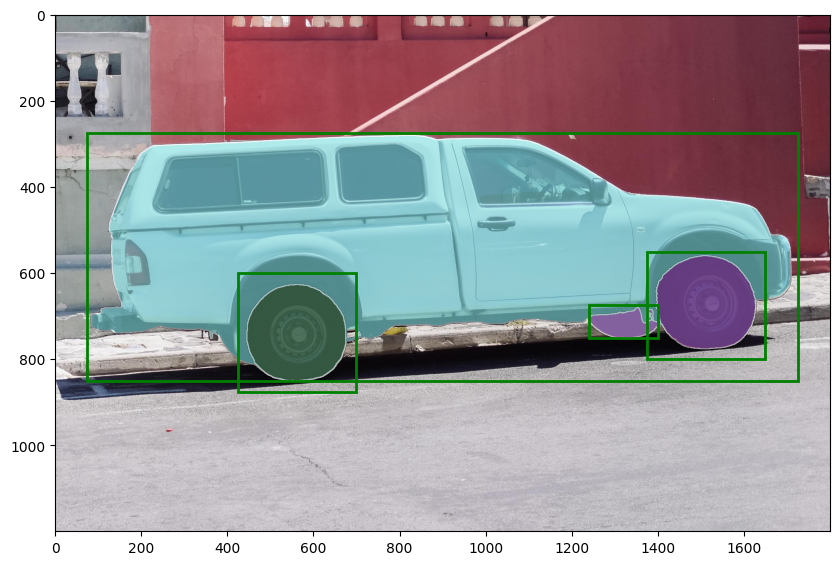

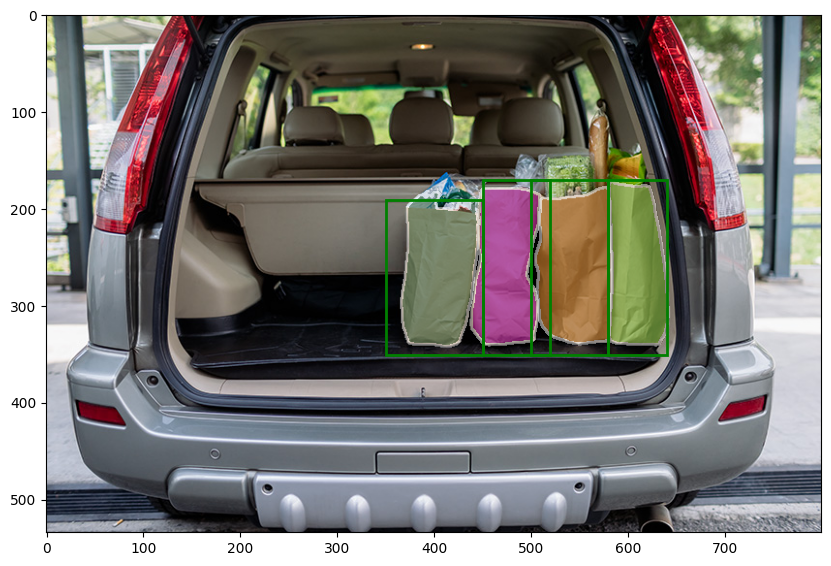

In [24]:
for image, boxes, masks in zip(img_batch, boxes_batch, best_masks):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)   
    for mask in masks:
        show_mask(mask, plt.gca(), random_color=True)
        # break
    for box in boxes:
        show_box(box, plt.gca())
        # break

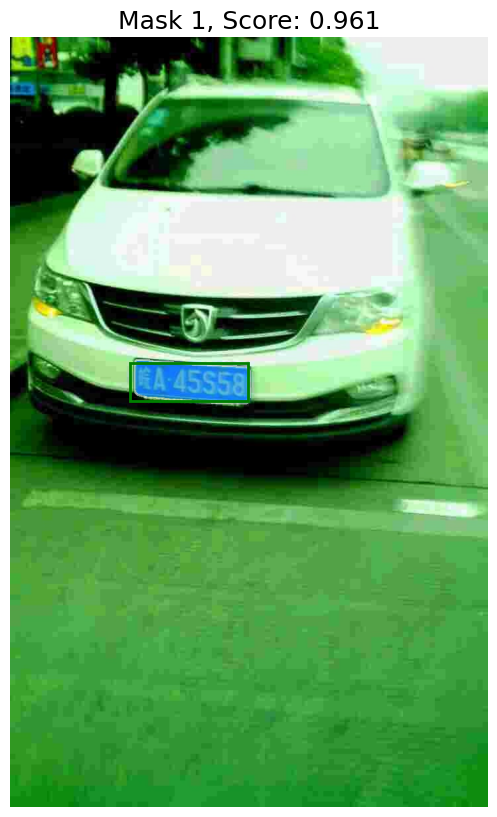

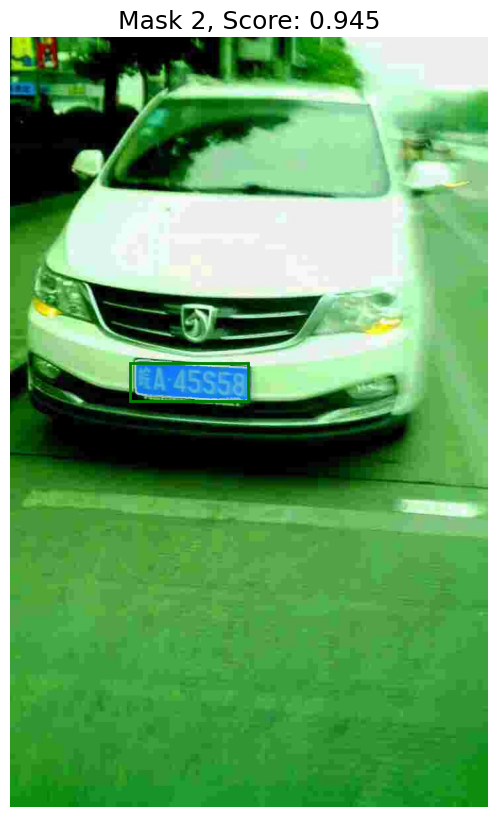

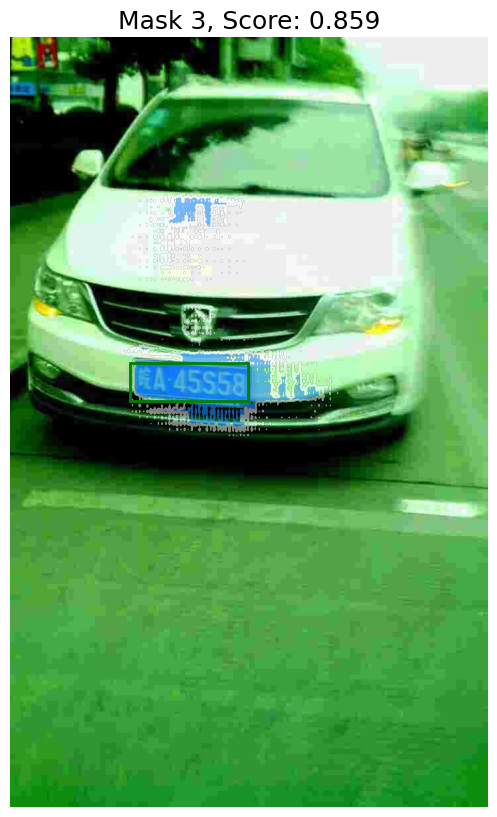

In [12]:
image_path = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\CCPD2019.tar\CCPD2019\ccpd_base'
image_path += r'\0092816091954-94_82-181&490_358&548-363&554_189&540_190&484_364&498-0_0_28_29_16_29_32-133-13.jpg'
image = Image.open(image_path)
image = np.array(image.convert("RGB"))
predictor.set_image(image)
    
input_box = np.array([181, 490, 358, 548])
masks, scores, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=True,
)
sorted_ind = np.argsort(scores)[::-1]
masks = masks[sorted_ind]
scores = scores[sorted_ind]
show_masks(image, masks, scores, box_coords=input_box, borders=True)


  0%|          | 0/50 [00:00<?, ?it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\metal_jpg.rf.677b9def4b568e23b52fbf84bac24e8d.jpg


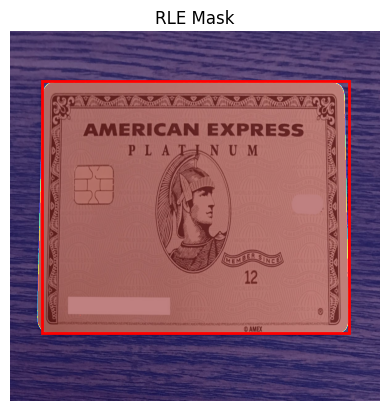

  2%|▏         | 1/50 [00:01<01:23,  1.71s/it]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\HfP-ARCC-Amex-Rewards-credit-card-webp_webp.rf.27182f3eba0391099a8f67768d8ccd11.jpg


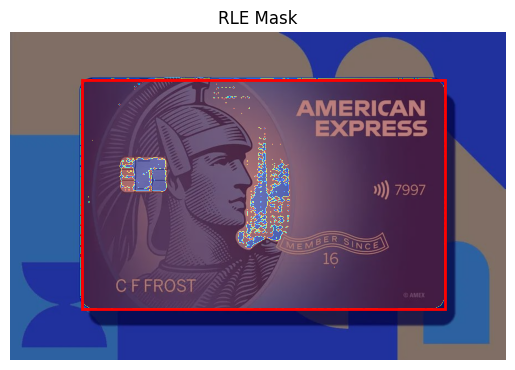

  4%|▍         | 2/50 [00:02<00:51,  1.08s/it]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\img26_png.rf.53426825356f37cc3240fa2a3401cf35.jpg


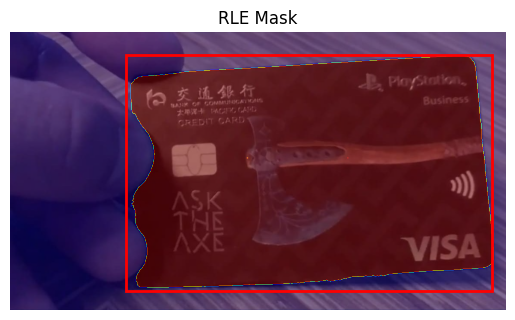

  6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\Amex-Payback-WEB_jpg.rf.5c1102240d4150c8c40aff49bc14b818.jpg


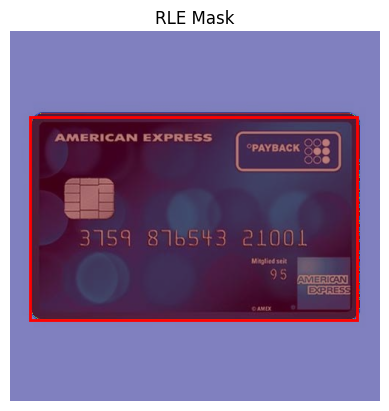

  8%|▊         | 4/50 [00:03<00:32,  1.43it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\img30_png.rf.cc0d87f2d7bf4c514068ef1d8f2fa5fc.jpg


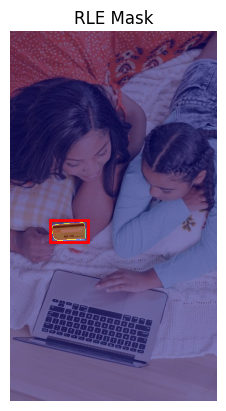

 10%|█         | 5/50 [00:03<00:28,  1.59it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\img16_png.rf.2dde31e8049714de5c9cbe12aa13e539.jpg


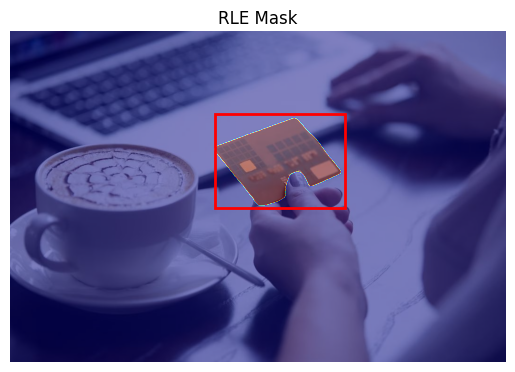

 12%|█▏        | 6/50 [00:04<00:26,  1.65it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\Captura-de-tela-2023-05-02-202653_png.rf.2e3345cd987f73d1bba98832f978399d.jpg


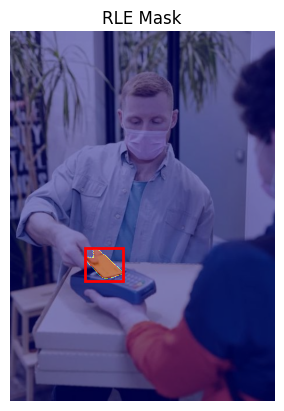

 14%|█▍        | 7/50 [00:04<00:24,  1.74it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\image34_jpeg.rf.bc182b472269f44e38fe18dc56b7022f.jpg


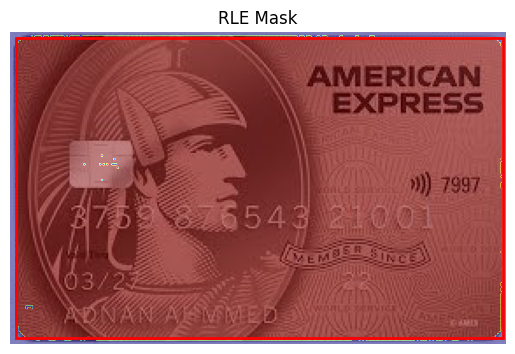

 16%|█▌        | 8/50 [00:05<00:23,  1.81it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\american-express-platinum-reserve-credit-card_jpg.rf.0934c7a0ac9e8d120077cb5e0ef5f4f8.jpg


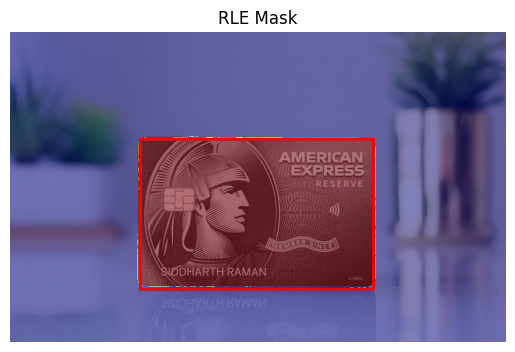

 18%|█▊        | 9/50 [00:06<00:23,  1.78it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\images-58-_jpg.rf.d696441c1aa9adb657c5fd52bd0293ad.jpg


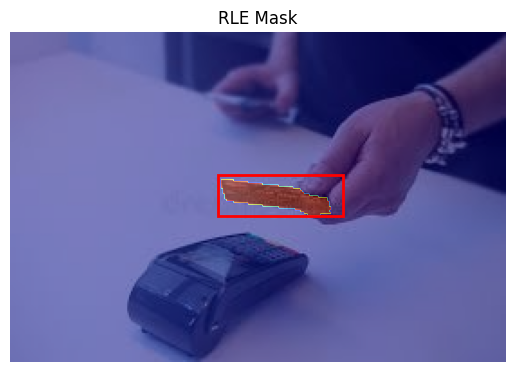

 20%|██        | 10/50 [00:06<00:21,  1.85it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\images_jpg.rf.f25b0cc437d14acad3fb15929b0cf84c.jpg


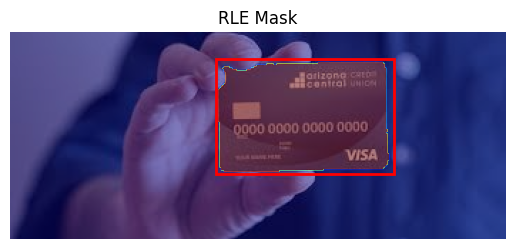

 22%|██▏       | 11/50 [00:07<00:20,  1.93it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\visa1_png.rf.1dc72caee9b6ee9f25ac0271e710e134.jpg


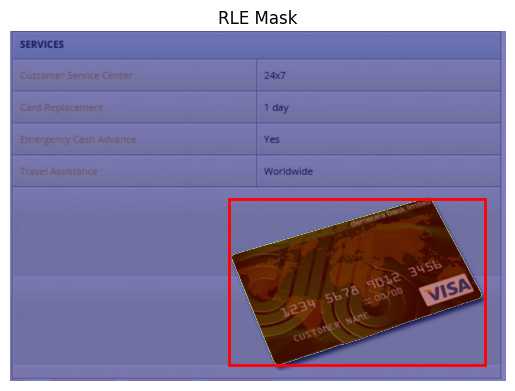

 24%|██▍       | 12/50 [00:07<00:19,  1.93it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\American-Express-SmartEarn-Vs-Standard-Chartered-Rewards-Credit-Card_webp.rf.f02a4886ca19bdbcd91f33eae0d0cc16.jpg


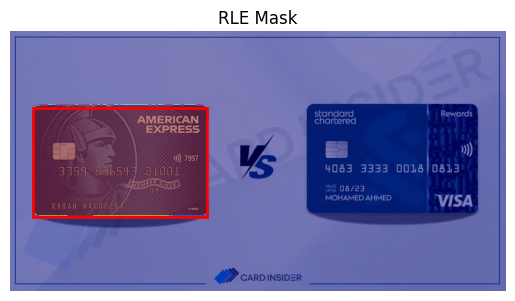

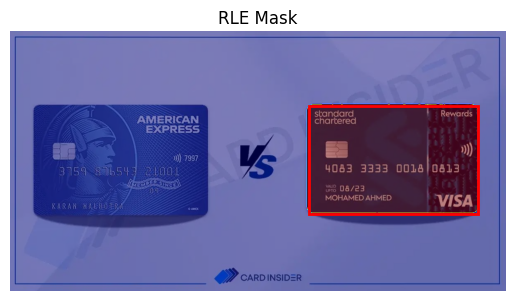

 26%|██▌       | 13/50 [00:08<00:21,  1.74it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\with_env_125_jpeg_jpg.rf.dfcbb22ac9cce330a8fea47053cfcab9.jpg


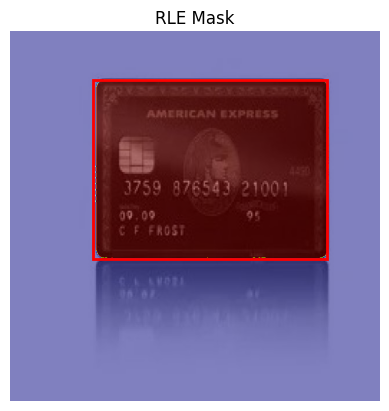

 28%|██▊       | 14/50 [00:08<00:19,  1.81it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\Captura-de-tela-2023-05-02-202539_png.rf.9efd2a035525b8bd5d660494eac08f24.jpg


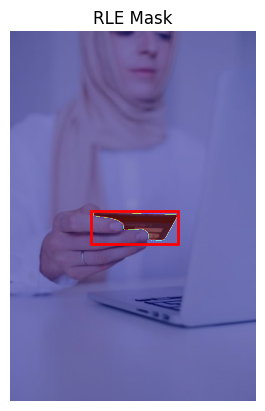

 30%|███       | 15/50 [00:09<00:18,  1.88it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\with_env_153_jpeg_jpg.rf.2d4c6003431e88e4aff7cbf6c8a505ce.jpg


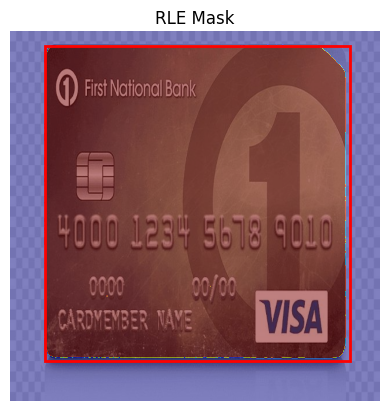

 32%|███▏      | 16/50 [00:09<00:18,  1.88it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\image23_jpeg.rf.e1af32b5c6c3fc04cbbbf5cce90d2623.jpg


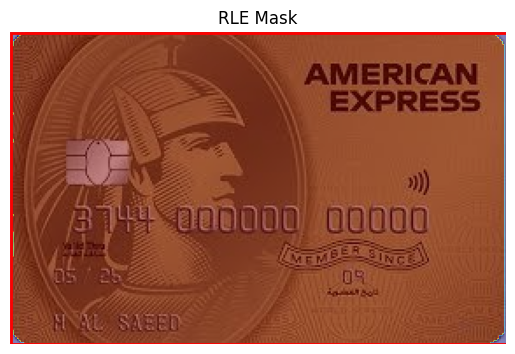

 34%|███▍      | 17/50 [00:10<00:17,  1.91it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\jjh_jpg.rf.eec236a26f4ef9dda769ab2b30f217f2.jpg


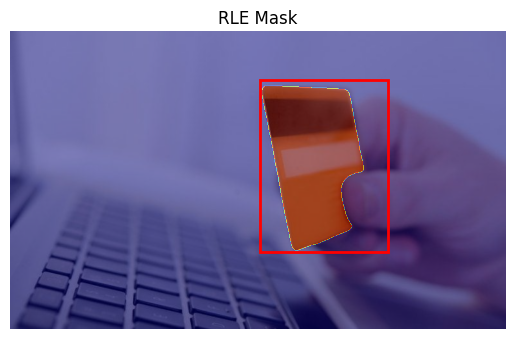

 36%|███▌      | 18/50 [00:10<00:16,  1.92it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\cvbnvcbn_jpg.rf.a42037d732a6320913d39746b02a904d.jpg


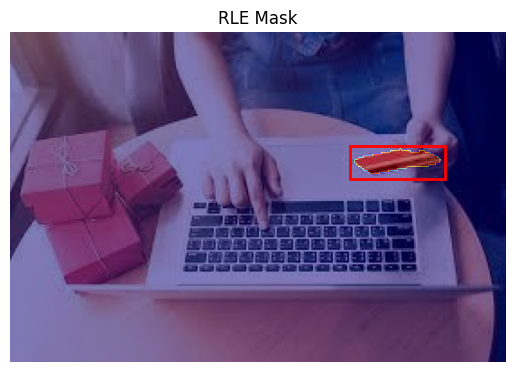

 38%|███▊      | 19/50 [00:11<00:16,  1.94it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\image8_jpeg.rf.15521b647f998bb37553ad4b3e32696b.jpg


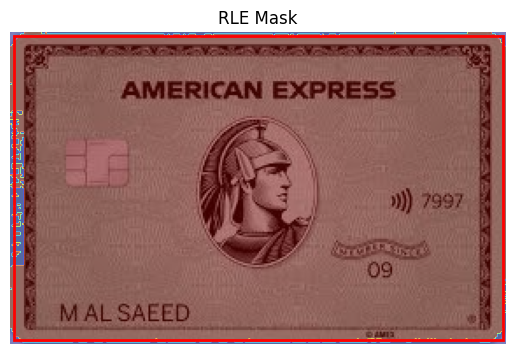

 40%|████      | 20/50 [00:11<00:15,  1.95it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\Blue20Cash20Preferred20Card_png.rf.a4533474c236ef343a1d0cffd826ca0f.jpg


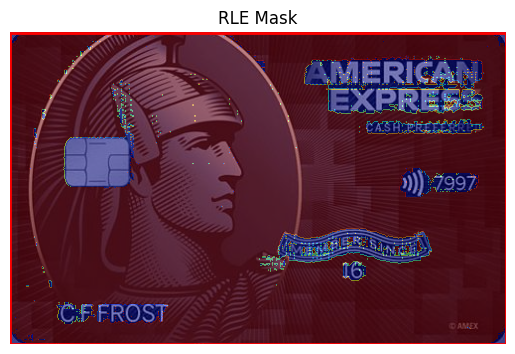

 42%|████▏     | 21/50 [00:12<00:14,  1.95it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\Captura-de-tela-2023-05-02-202624_png.rf.8e1f62a06b59b6857034c8d39fad3d95.jpg


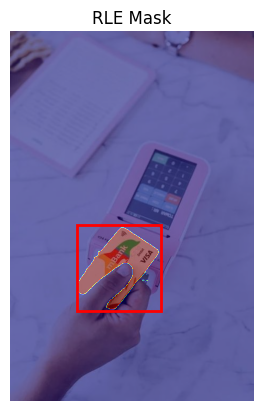

 44%|████▍     | 22/50 [00:12<00:15,  1.84it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\image18_jpeg.rf.7b766f746d4dc5f61335b087f08e7b65.jpg


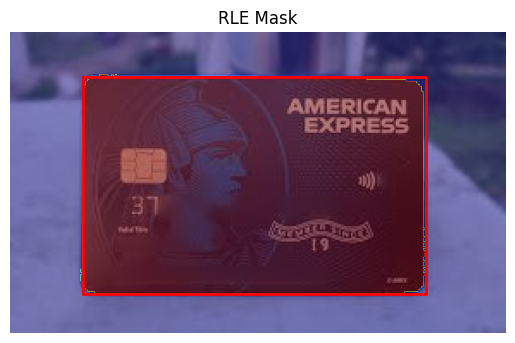

 46%|████▌     | 23/50 [00:13<00:14,  1.89it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\amex-platinum-2023_jpg.rf.e6623a7ee5e3b01dba2badefe18c12ef.jpg


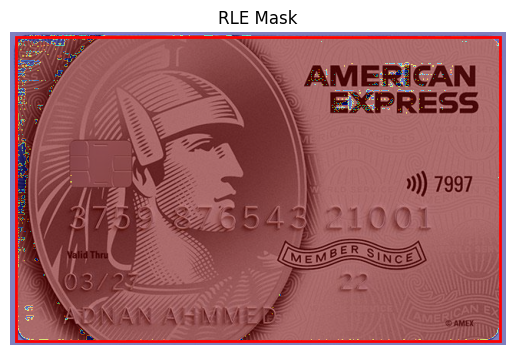

 48%|████▊     | 24/50 [00:13<00:13,  1.89it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\img36_jpeg.rf.627d62f078af978d3b810783d1ea1c62.jpg


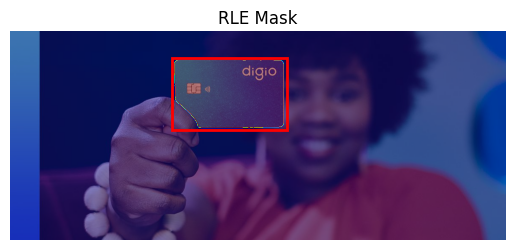

 50%|█████     | 25/50 [00:14<00:13,  1.90it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\download_jpg.rf.817fee3110330858ecb064b4fe758c08.jpg


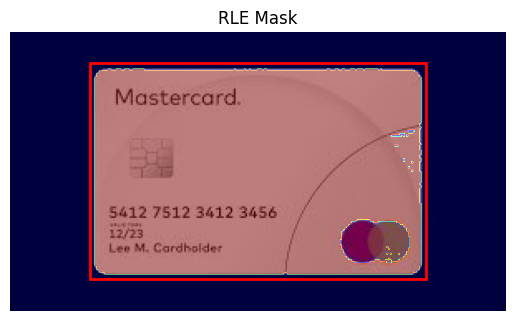

 52%|█████▏    | 26/50 [00:14<00:12,  1.98it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\with_env_16_jpeg_jpg.rf.612c7f8af0df2f0f21fbab46eba64563.jpg


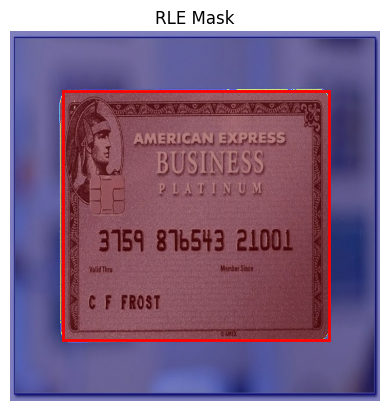

 54%|█████▍    | 27/50 [00:15<00:11,  1.95it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\with_env_160_jpeg_jpg.rf.c0ffd3c1163ec46325e39467ebca575a.jpg


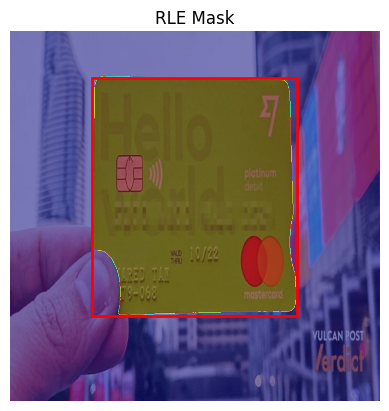

 56%|█████▌    | 28/50 [00:15<00:11,  1.92it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\header-card_jpg.rf.ede14da4cea0fe95046562b8d0bef6f7.jpg


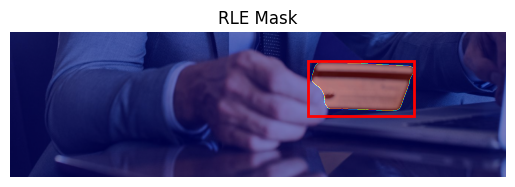

 58%|█████▊    | 29/50 [00:16<00:10,  1.92it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\Captura-de-tela-2023-05-02-203002_png.rf.d955890195545aea409c42f93820ea42.jpg


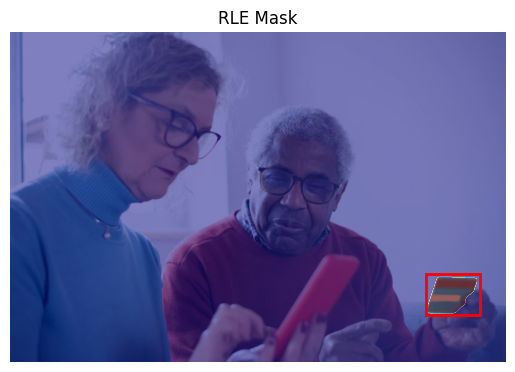

 60%|██████    | 30/50 [00:17<00:10,  1.87it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\with_env_177_jpeg_jpg.rf.5e6ff5c41eb9fc26c8aa0d8be0f419ba.jpg


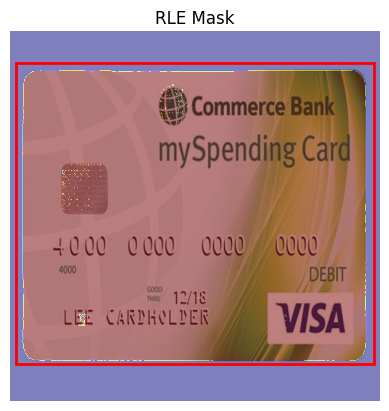

 62%|██████▏   | 31/50 [00:17<00:10,  1.88it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\Captura-de-tela-2023-05-02-203017_png.rf.ac8a80780f262c449972e270909fe2f5.jpg


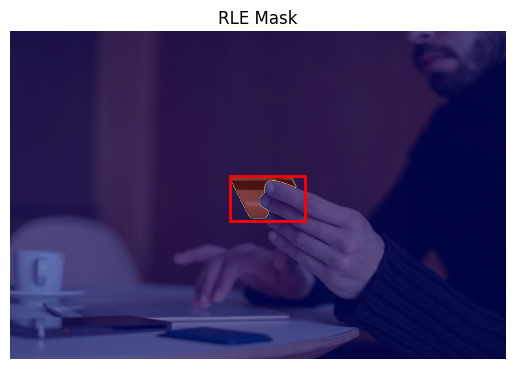

 64%|██████▍   | 32/50 [00:18<00:09,  1.86it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\nmrtn_jpg.rf.52e39d12641b2a60d7cf5f5e33d3caca.jpg


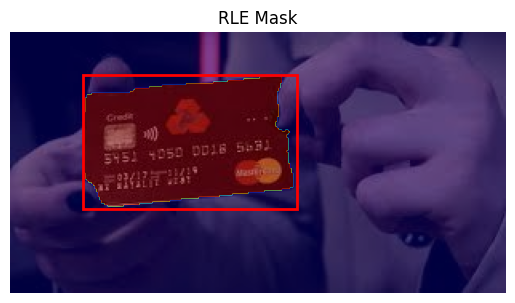

 66%|██████▌   | 33/50 [00:18<00:08,  1.90it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\img21_png.rf.a7095c31c8ef219ea3b950b858e0df40.jpg


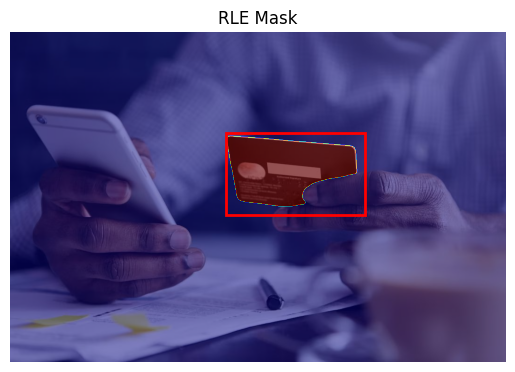

 68%|██████▊   | 34/50 [00:19<00:08,  1.85it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\image30_jpeg.rf.da9ba730ddd306b7add51afb10dfe689.jpg


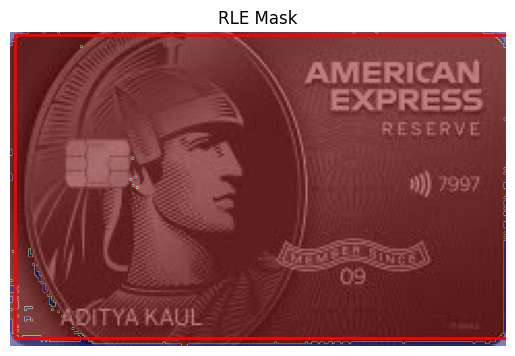

 70%|███████   | 35/50 [00:19<00:07,  1.90it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\images-28-_jpg.rf.aa0b4af4a2ef91fed0d54a8c71aaef61.jpg


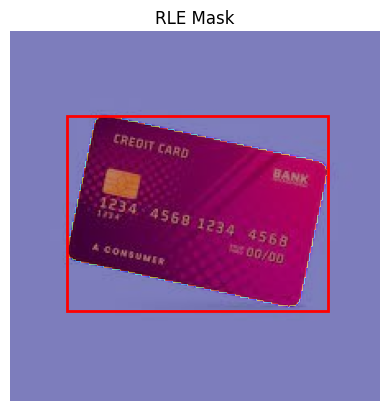

 72%|███████▏  | 36/50 [00:20<00:07,  1.96it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\with_env_184_jpeg_jpg.rf.78a0d2ac8b37a8c2bd3a20812eee0577.jpg


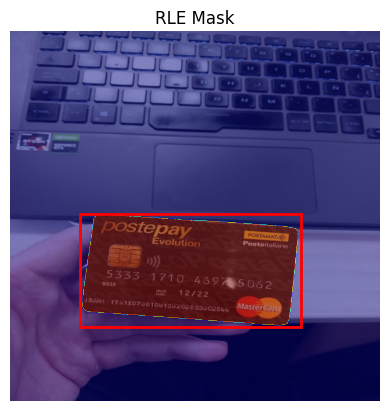

 74%|███████▍  | 37/50 [00:20<00:06,  1.95it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\bank-of-america-cash-rewards-e9_jpg.rf.c99b7ab11c1ebbf4c1c6364fc66ed731.jpg


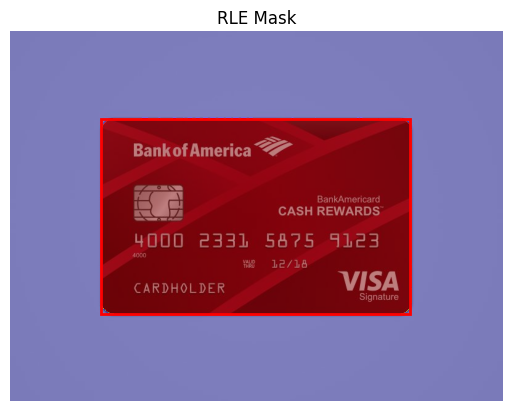

 76%|███████▌  | 38/50 [00:21<00:06,  1.94it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\hkjlhjk_jpg.rf.97ddd33338b3195404a9a9b7ac04c546.jpg


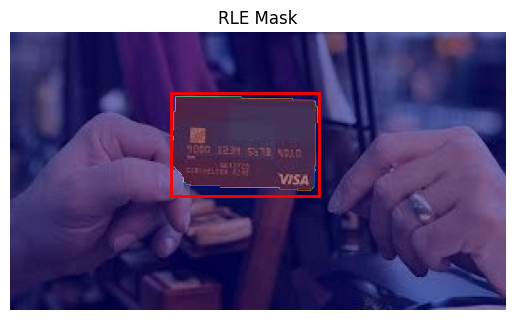

 78%|███████▊  | 39/50 [00:21<00:05,  1.95it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\images-38-_jpg.rf.0003fc82b9e66b330840478ea067e657.jpg


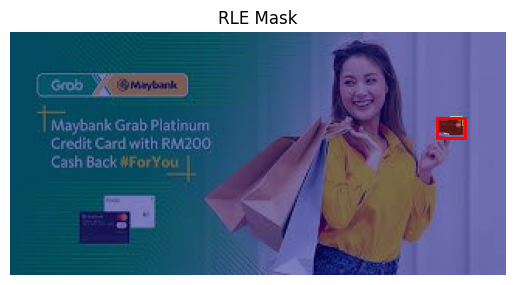

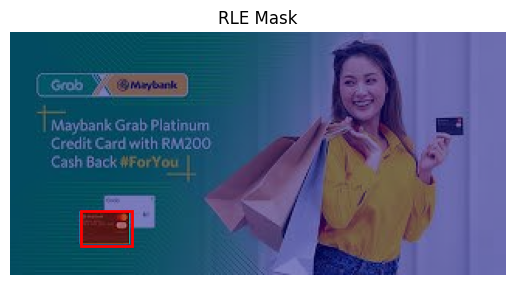

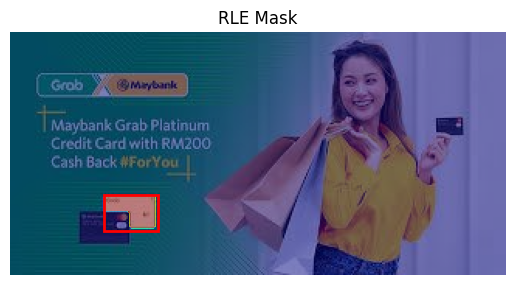

 80%|████████  | 40/50 [00:22<00:05,  1.76it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\with_env_111_jpeg_jpg.rf.06b1c1527cc3773b2829d3247f0aca9e.jpg


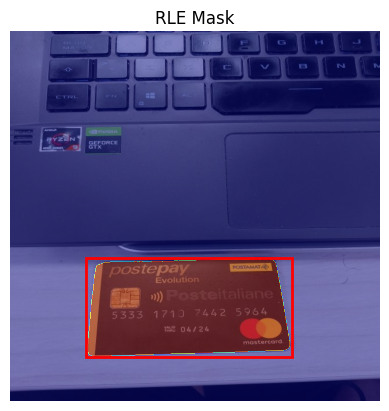

 82%|████████▏ | 41/50 [00:22<00:05,  1.77it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\img51_jpeg.rf.385df0a841404d0bd421eefb6e6bfbde.jpg


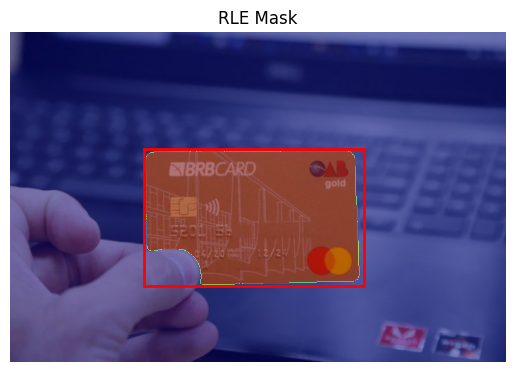

 84%|████████▍ | 42/50 [00:23<00:04,  1.80it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\0910-BOC-Contactless-Card-FINAL-Email-Blast-small_jpg.rf.f1105b2a0a2cf781aea6c1a85b77d8a6.jpg


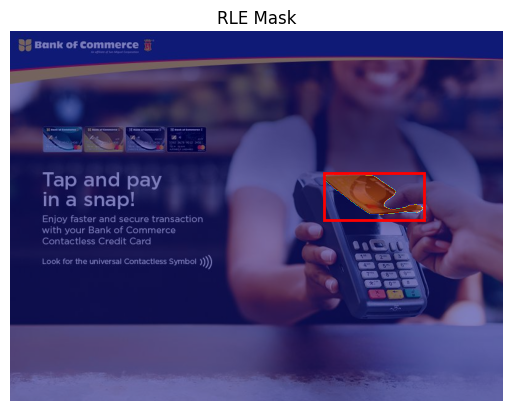

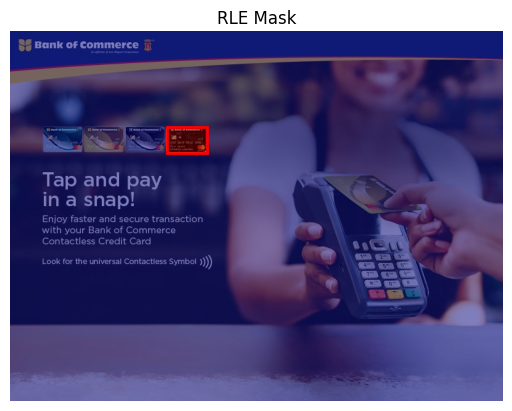

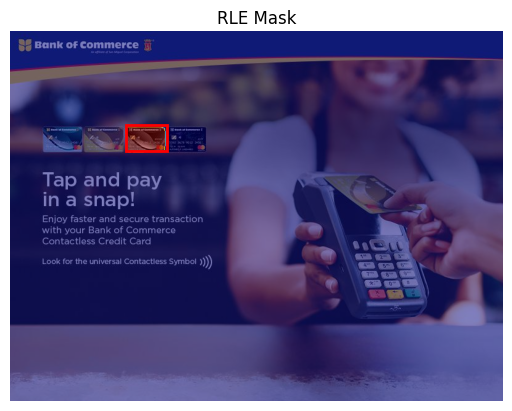

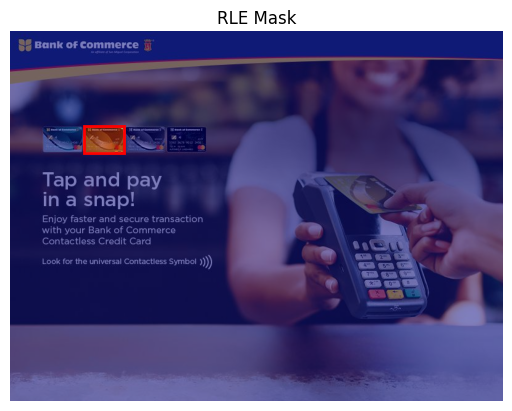

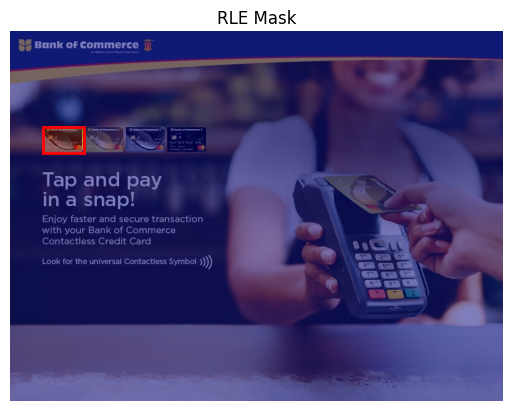

 86%|████████▌ | 43/50 [00:24<00:05,  1.32it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\with_env_190_jpeg_jpg.rf.ebf37b9d8c0b85171106a92bb196db28.jpg


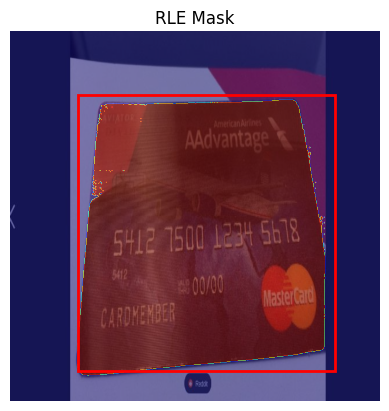

 88%|████████▊ | 44/50 [00:25<00:04,  1.45it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\with_env_18_jpeg_jpg.rf.cff588ce7182009ad7258b3b81c40d6b.jpg


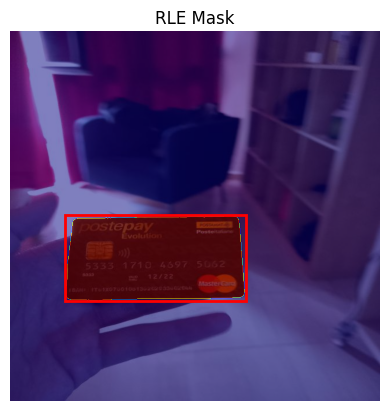

 90%|█████████ | 45/50 [00:25<00:03,  1.55it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\prodBank_thumb_ccNewPageAmexCashbackRewardsPlus_png.rf.b0be31d6ebdbbb20c2085b2851517305.jpg


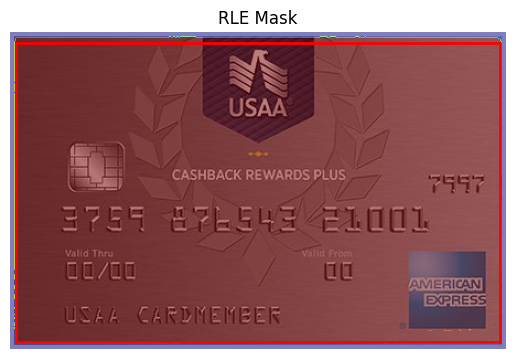

 92%|█████████▏| 46/50 [00:26<00:02,  1.66it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\img44_png.rf.d19338040bd39922be91421f29fe445d.jpg


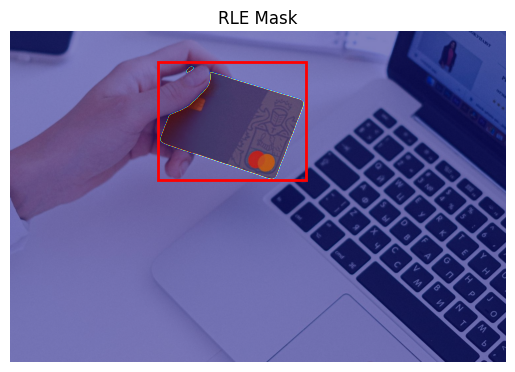

 94%|█████████▍| 47/50 [00:26<00:01,  1.61it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\Membership_Rewards_Card_webp.rf.8a5632a90f378b3f01e70b02071762eb.jpg


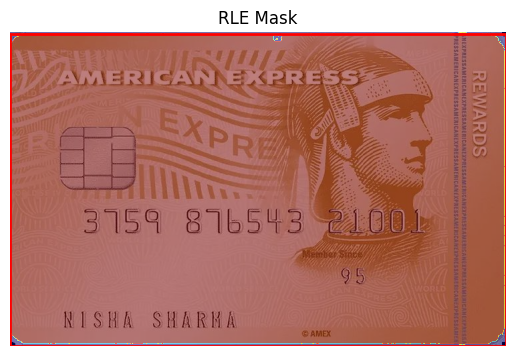

 96%|█████████▌| 48/50 [00:27<00:01,  1.67it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\Captura-de-tela-2023-05-02-195031_png.rf.05adabac2c16eaabeb43e5efb2dac972.jpg


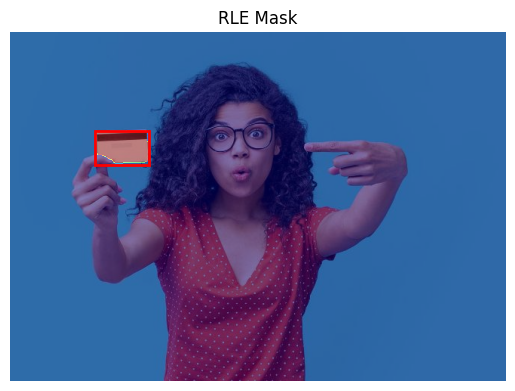

 98%|█████████▊| 49/50 [00:28<00:00,  1.75it/s]

C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\with_env_245_jpeg_jpg.rf.b4bf567d3292618eb8c155ae11757ca3.jpg


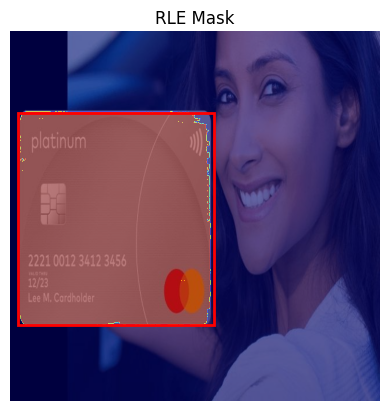

100%|██████████| 50/50 [00:28<00:00,  1.75it/s]


In [2]:
# bbox_to_mask_coco_to_coco
import json
import os
import numpy as np
from tqdm import tqdm
from PIL import Image
from pycocotools import mask as maskUtils

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

def visualize_rle_annotation(rle, bbox, image=None, title="RLE Mask"):
    if isinstance(rle['counts'], str):
        rle['counts'] = rle['counts'].encode('ascii')
    mask = maskUtils.decode(rle)

    import matplotlib.pyplot as plt
    if image is not None:
        plt.imshow(image, cmap='gray')
        plt.imshow(mask, cmap='jet', alpha=0.5)
    else:
        plt.imshow(mask, cmap='gray')

    if bbox is not None:
        x0, y0, x1, y1 = bbox
        plt.gca().add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, edgecolor='red', facecolor='none', lw=2))
        
    plt.title(title)
    plt.axis('off')
    plt.show()

# --- CONFIG ---
COCO_JSON_PATH = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test\_annotations.coco.json'
IMAGES_DIR = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Credit Cards.v1i.coco\test'  # Path to where the image files are stored

# COCO_JSON_PATH = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Screen Detection YOLOv8\dataset\screen.json'
# IMAGES_DIR = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Screen Detection YOLOv8\dataset\images'  # Path to where the image files are stored

# NEW_COCO_JSON_PATH = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Screen Detection YOLOv8\dataset\screen_segmentation.json'
SAM2_CHECKPOINT = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\checkpoints\sam2.1_hiera_large.pt"
MODEL_CFG = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\sam2\configs\sam2.1\sam2.1_hiera_l.yaml"
DEVICE = 'cuda'  # or 'cpu'
MULTIMASK = True  # Set to False if you only want a single mask per box

# --- Load COCO JSON ---
with open(COCO_JSON_PATH, 'r') as f:
    coco_data = json.load(f)

images = coco_data['images']
annotations = coco_data['annotations']
categories = coco_data['categories']

# images = images[328:]

# --- Build SAM2 ---
sam2_model = build_sam2(MODEL_CFG, SAM2_CHECKPOINT, device=DEVICE)
predictor = SAM2ImagePredictor(sam2_model)

# --- Prepare Image-to-Annotation Map ---
image_id_to_annotations = {}
for ann in annotations:
    image_id_to_annotations.setdefault(ann['image_id'], []).append(ann)

# --- Conversion ---
new_annotations = []
next_ann_id = 1

batch_size = 1  # Modify if needed
for i in tqdm(range(0, len(images), batch_size)):
    batch_imgs = []
    batch_boxes = []
    img_metas = []

    for j in range(i, min(i + batch_size, len(images))):
        img_info = images[j]
        img_path = os.path.join(IMAGES_DIR, img_info['file_name'])
        print(img_path)
        img = np.array(Image.open(img_path).convert('RGB'))
        batch_imgs.append(img)
        img_metas.append(img_info)

        # Get and convert boxes
        anns = image_id_to_annotations.get(img_info['id'], [])
        xyxy_boxes = []
        for ann in anns:
            x, y, w, h = ann['bbox']
            xyxy_boxes.append([x, y, x + w, y + h])

        if xyxy_boxes:  # only append if not empty
            batch_boxes.append(np.array(xyxy_boxes, dtype=np.float32))
        else:
            batch_boxes.append(np.empty((0, 4), dtype=np.float32))

    # Skip batch if no boxes
    if all(len(b) == 0 for b in batch_boxes):
        continue

    predictor.set_image_batch(batch_imgs)
    masks_batch, scores_batch, _ = predictor.predict_batch(
        None, None,
        box_batch=batch_boxes,
        multimask_output=MULTIMASK
    )

    for img_info, anns, masks, scores, boxes, img in zip(img_metas, batch_boxes, masks_batch, scores_batch, batch_boxes, batch_imgs):
        if len(masks) == 0:
            print(f"No masks for image {img_info['id']}")
            continue

        if boxes.shape[0] == 1:
            masks = masks[None, ...]
            scores = scores[None, ...]

        selected_masks = masks[range(len(masks)), np.argmax(scores, axis=-1)] if MULTIMASK else masks[:, 0]

        for mask, ann, box in zip(selected_masks, image_id_to_annotations[img_info['id']], boxes):
            if mask.sum() == 0:
                print(f"Empty mask for image {img_info['id']}, annotation {ann['id']}") 

            rle = maskUtils.encode(np.asfortranarray(mask.astype(np.uint8)))
            area = float(maskUtils.area(rle))
            bbox = maskUtils.toBbox(rle).tolist()

            new_ann = {
                "id": next_ann_id,
                "image_id": ann['image_id'],
                "category_id": ann['category_id'],
                "segmentation": {
                    "size": rle['size'],
                    "counts": rle['counts'].decode('ascii')
                },
                "area": area,
                "bbox": bbox,
                "iscrowd": ann.get('iscrowd', 0),
            }
            new_annotations.append(new_ann)
            next_ann_id += 1

            # Visualize
            visualize_rle_annotation(rle, image=img, bbox=box)

In [ ]:
# bbox_to_mask_ALPR_to_coco
import os
import json
from PIL import Image
import numpy as np
from tqdm import tqdm
from pycocotools import mask as maskUtils

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

# --- CONFIG ---
DATASET_DIR = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\License_plate_ALPR\UFPR-ALPR dataset'
OUT_JSON = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\License_plate_ALPR\UFPR-ALPR dataset\ALPR_segmentation.json'
SAM2_CHECKPOINT = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\checkpoints\sam2.1_hiera_large.pt"
MODEL_CFG = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\sam2\configs\sam2.1\sam2.1_hiera_l.yaml"
DEVICE = 'cuda'
CATEGORY_ID = 1
CATEGORY_NAME = "plate"

def visualize_rle_annotation(rle, bbox, image=None, title="RLE Mask"):
    if isinstance(rle['counts'], str):
        rle['counts'] = rle['counts'].encode('ascii')
    mask = maskUtils.decode(rle)

    import matplotlib.pyplot as plt
    if image is not None:
        plt.imshow(image, cmap='gray')
        plt.imshow(mask, cmap='jet', alpha=0.5)
    else:
        plt.imshow(mask, cmap='gray')

    if bbox is not None:
        x0, y0, x1, y1 = bbox
        plt.gca().add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, edgecolor='red', facecolor='none', lw=2))
        
    plt.title(title)
    plt.axis('off')
    plt.show()

# --- Setup SAM2 ---
model = build_sam2(MODEL_CFG, SAM2_CHECKPOINT, device=DEVICE)
predictor = SAM2ImagePredictor(model)

# --- Prepare Output Containers ---
images_coco = []
annotations_coco = []
categories_coco = [{"id": CATEGORY_ID, "name": CATEGORY_NAME}]

image_id = 1
annotation_id = 1

# --- Loop through dataset ---
files = []
for splitdir in os.listdir(DATASET_DIR):
    splitdir = os.path.join(DATASET_DIR, splitdir)
    if not os.path.isdir(splitdir):
        continue
    for trackdir in os.listdir(splitdir):
        trackdir = os.path.join(splitdir, trackdir)
        if not os.path.isdir(trackdir):
            continue
        for filename in os.listdir(trackdir):
            if filename.endswith(".txt"):
                files.append(os.path.join(trackdir, filename))

for file in tqdm(files):
    txt_path = os.path.join(DATASET_DIR, file)
    img_path = os.path.splitext(txt_path)[0] + '.jpg'
    if not os.path.exists(img_path):
        img_path = os.path.splitext(txt_path)[0] + '.png'
        if not os.path.exists(img_path):
            continue

    with open(txt_path, 'r') as f:
        lines = f.readlines()

    corner_line = [line for line in lines if line.startswith('corners:')]
    if not corner_line:
        continue

    # Parse corners
    corner_str = corner_line[0].split(':', 1)[1].strip()
    coords = [tuple(map(int, pt.split(','))) for pt in corner_str.split()]
    xs, ys = zip(*coords)
    x_min, y_min = min(xs), min(ys)
    x_max, y_max = max(xs), max(ys)
    xyxy_box = [x_min, y_min, x_max, y_max]

    # Load image
    img = Image.open(img_path).convert('RGB')
    img_np = np.array(img)
    h_img, w_img = img_np.shape[:2]

    # Add image metadata
    image_entry = {
        "id": image_id,
        "file_name": os.path.basename(img_path),
        "height": h_img,
        "width": w_img
    }

    # Predict mask
    predictor.set_image_batch([img_np])
    masks_batch, scores_batch, _ = predictor.predict_batch(
        None, None,
        box_batch=[np.array([xyxy_box], dtype=np.float32)],
        multimask_output=True
    )

    best_mask = masks_batch[0][np.argmax(scores_batch[0])]

    if best_mask.sum() == 0:
        print(f"Warning: Empty mask for {img_path}")
        continue

    # Convert mask to RLE
    rle = maskUtils.encode(np.asfortranarray(best_mask.astype(np.uint8)))
    area = float(maskUtils.area(rle))
    bbox = maskUtils.toBbox(rle).tolist()

    annotation = {
        "id": annotation_id,
        "image_id": image_id,
        "category_id": CATEGORY_ID,
        "segmentation": {
            "size": rle['size'],
            "counts": rle['counts'].decode('ascii')
        },
        "area": area,
        "bbox": bbox,
        "iscrowd": 0
    }

    visualize_rle_annotation(rle, image=img, bbox=xyxy_box)

    images_coco.append(image_entry)
    annotations_coco.append(annotation)
    image_id += 1
    annotation_id += 1


In [ ]:
# bbox_to_mask_ccpd_to_coco
import os
import json
from PIL import Image
import numpy as np
from tqdm import tqdm
from pycocotools import mask as maskUtils

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

def visualize_rle_annotation(rle, bbox=None, image=None, title="RLE Mask"):
    if isinstance(rle['counts'], str):
        rle['counts'] = rle['counts'].encode('ascii')
    mask = maskUtils.decode(rle)

    import matplotlib.pyplot as plt
    if image is not None:
        plt.imshow(image, cmap='gray')
        plt.imshow(mask, cmap='jet', alpha=0.5)
    else:
        plt.imshow(mask, cmap='gray')

    if bbox is not None:
        x0, y0, x1, y1 = bbox
        plt.gca().add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, edgecolor='red', facecolor='none', lw=2))
        
    plt.title(title)
    plt.axis('off')
    plt.show()

# --- CONFIG ---
CCPD_DIR = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\CCPD2019.tar\CCPD2019\ccpd_base'
OUTPUT_JSON = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\CCPD2019.tar\CCPD2019\ccpd_coco_segmentation.json'
SAM2_CHECKPOINT = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\checkpoints\sam2.1_hiera_large.pt"
MODEL_CFG = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\sam2\configs\sam2.1\sam2.1_hiera_l.yaml"
DEVICE = 'cuda'
CATEGORY_ID = 1
CATEGORY_NAME = 'license_plate'

# --- Init SAM2 ---
sam2_model = build_sam2(MODEL_CFG, SAM2_CHECKPOINT, device=DEVICE)
predictor = SAM2ImagePredictor(sam2_model)

# --- Output Containers ---
images_coco = []
annotations_coco = []
categories_coco = [{"id": CATEGORY_ID, "name": CATEGORY_NAME}]

image_id = 1
annotation_id = 1

files = [f for f in os.listdir(CCPD_DIR) if f.endswith(('.jpg', '.png'))]
files = files[:15000]
for filename in tqdm(files):
    img_path = os.path.join(CCPD_DIR, filename)

    # Parse corner field from filename
    fields = filename.split('-')
    if len(fields) < 3:
        print(f"Skipping malformed filename: {filename}")
        continue

    try:
        bbox_pts = fields[2].split('_')
        x1, y1 = map(int, bbox_pts[0].split('&'))
        x2, y2 = map(int, bbox_pts[1].split('&'))
        xyxy_box = [x1, y1, x2, y2]
    except Exception as e:
        print(f"Error parsing bbox from: {filename} | {e}")
        continue

    # Load image
    img = Image.open(img_path).convert('RGB')
    img_np = np.array(img)
    h_img, w_img = img_np.shape[:2]

    # Add image entry
    images_coco.append({
        "id": image_id,
        "file_name": filename,
        "height": h_img,
        "width": w_img
    })

    # Run SAM2
    predictor.set_image_batch([img_np])
    masks_batch, scores_batch, _ = predictor.predict_batch(
        None, None,
        box_batch=[np.array([xyxy_box], dtype=np.float32)],
        multimask_output=True
    )

    best_mask = masks_batch[0][np.argmax(scores_batch[0])]

    if best_mask.sum() == 0:
        print(f"Empty mask for {filename}")
        continue

    rle = maskUtils.encode(np.asfortranarray(best_mask.astype(np.uint8)))
    area = float(maskUtils.area(rle))
    bbox = maskUtils.toBbox(rle).tolist()

    annotations_coco.append({
        "id": annotation_id,
        "image_id": image_id,
        "category_id": CATEGORY_ID,
        "segmentation": {
            "size": rle['size'],
            "counts": rle['counts'].decode('ascii')
        },
        "area": area,
        "bbox": bbox,
        "iscrowd": 0
    })

    visualize_rle_annotation(rle, image=img, bbox=None)

    image_id += 1
    annotation_id += 1
